## Annotation

In this notebook I will determine the intervals of slices that feature erosion. These intervals were hadpicked with the help of Andrei Anisimov, who had gathered this data in the first place.

File configuration

In [1]:
# Adjust the frac parameter for loess smoothing
# to control the degree of smoothing applied to the scan data.
slices_dir = "../scandata/slices loess frac=0.20"

Annotations for the erosion:

In [2]:
annotations = {
    '221111_144114__binary_onlylines145900to148050': {
        (280, 560): 3,
        (590, 640): 2,
        (660, 700): 2,
        (740, 810): 2,
        (960, 1010): 2,
        (1140, 1200): 2,
        (1230, 1280): 2,
        (1380, 1400): 2,
        (1450, 1470): 2,
    },
    '221111_144114__binary_onlylines25660to28100': {
        (200, 530): 3,
        (590, 660): 2,
        (680, 740): 2,
        (790, 880): 2,
        (1080, 1110): 2,
        (1270, 1330): 2,
        (1380, 1430): 2,
        (1560, 1580): 2,
        (1660, 1700): 2,
    },
    '221111_144114__binary_onlylines47178to50517': {
        (2550, 3060): 3,
        (2400, 2480): 2,
        (2350, 2370): 2,
        (2270, 2300): 2,
        (1860, 1900): 2,
        (1540, 1620): 2,
        (1400, 1450): 2,
        (1170, 1200): 2,
        (1070, 1100): 2,
    },
    '221111_144114__binary_onlylines86841to90142': {
        (240, 640): 3,
        (730, 800): 2,
        (840, 910): 2,
        (950, 1080): 2,
        (1340, 1420): 2,
        (1670, 1740): 2,
        (1820, 1890): 2,
        (2130, 2170): 2,
        (2240, 2270): 2,
    },
    '221111_144114__binary_onlylines114378to117271': {
        (2130, 2630): 3,
        (1920, 2010): 2,
        (1790, 1890): 2,
        (1610, 1750): 2,
        (1310, 1380): 2,
        (1110, 1160): 2,
        (1010, 1050): 2,
        (860, 890): 2,
        (770, 800): 2,
    }
}

Libraries used:

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import glob

import os
import open3d as o3d

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Helper functions

A function for rendering an anotation of erosion onto a scatter plot

In [4]:
def annotation_line(ax, xmin, xmax, y, text, ytext = 0, linecolor = 'red', linewidth = 1, fontsize = 12):
    ax.annotate('',
                xy=(xmin, y),
                xytext=(xmax, y),
                xycoords='data',
                textcoords='data',
                arrowprops={'arrowstyle': '|-|',
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )
    
    ax.annotate('', 
                xy=(xmin, y), 
                xytext=(xmax, y), 
                xycoords='data', 
                textcoords='data',
                arrowprops={'arrowstyle': '<->', 
                            'color': linecolor, 
                            'linewidth':linewidth
                           }
               )

    xcenter = xmin + (xmax - xmin) / 2

    ax.annotate(text, xy=(xcenter,ytext), ha='center', va='center', fontsize=fontsize)

Let's load the pointclouds where we can see the erosion (difference between smoothed and original).

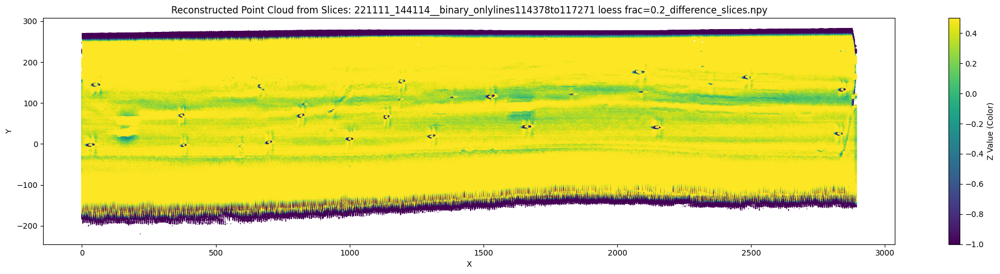

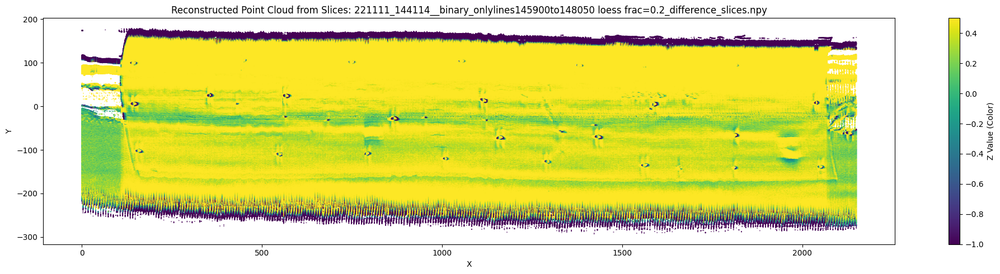

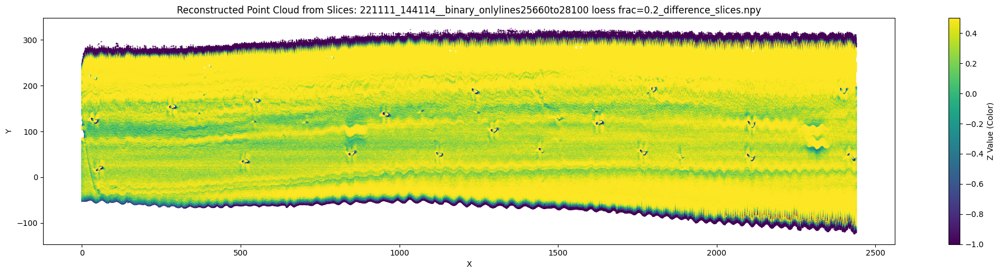

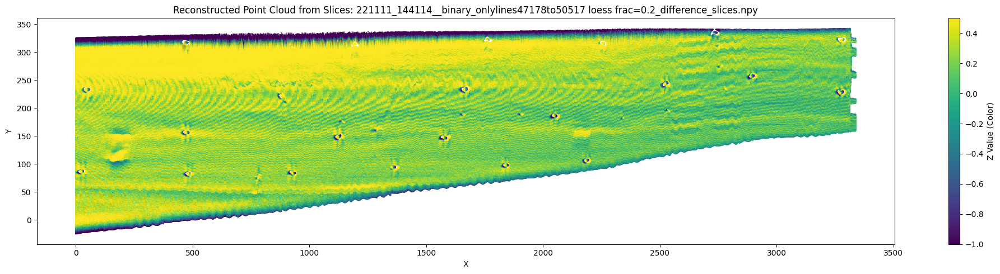

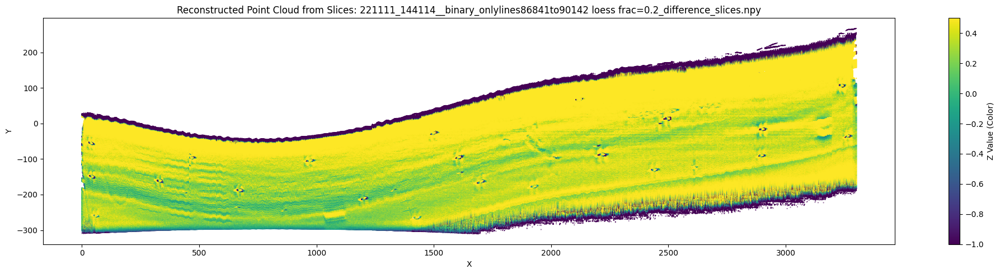

In [5]:
stacked_files = [f for f in os.listdir(slices_dir) if f.endswith("_slices.npy")]

for stacked_file in stacked_files:
    stacked_path = os.path.join(slices_dir, stacked_file)
    stacked = np.load(stacked_path)  # shape: (num_slices, max_points, 3)
    # Flatten to (num_slices * max_points, 3)
    points = stacked.reshape(-1, 3)
    # Remove padded zeros (optional: keep only rows where at least one coordinate is nonzero)
    mask = ~(np.all(points == 0, axis=1))
    points = points[mask]
    x, y, z = points[:, 0], points[:, 1], points[:, 2]
    plt.figure(figsize=(20, 5))
    sc = plt.scatter(x, y, c=z, s=0.1, vmin=-1, vmax=0.5)
    plt.title(f"Reconstructed Point Cloud from Slices: {stacked_file}")
    plt.xlabel("X")
    plt.ylabel("Y")
    cbar = plt.colorbar(sc)
    cbar.set_label("Z Value (Color)")
    plt.tight_layout()
    plt.show()

Now, let's assign each slice its annotation.

In [6]:
# Create a labeled copy of each stacked slices file
labeled_dir = slices_dir.rstrip("/") + "_labeled"
os.makedirs(labeled_dir, exist_ok=True)

for stacked_file in stacked_files:
    # Extract the base name to match with annotations
    base_name = stacked_file.replace("_slices.npy", "")
    # Find the annotation key that matches the base name
    annotation_key = None
    for key in annotations:
        if key in base_name:
            annotation_key = key
            break

    stacked_path = os.path.join(slices_dir, stacked_file)
    stacked = np.load(stacked_path)  # shape: (num_slices, max_points, 3)
    num_slices = stacked.shape[0]

    # Get the starting X coordinate for each slice (first nonzero X in each slice)
    slice_starts = []
    for i in range(num_slices):
        slice_points = stacked[i]
        nonzero_mask = ~(np.all(slice_points == 0, axis=1))
        if np.any(nonzero_mask):
            start_x = int(slice_points[nonzero_mask][0, 0])
        else:
            start_x = 0
        slice_starts.append(start_x)

    # Assign labels
    labels = np.zeros(num_slices, dtype=int)
    if annotation_key is not None:
        for (xmin, xmax), label in annotations[annotation_key].items():
            for i, start_x in enumerate(slice_starts):
                if xmin <= start_x < xmax:
                    labels[i] = label

    # Save labeled slices as a tuple (slices, labels)
    outname = stacked_file.replace("_slices.npy", "_slices_labeled.npy")
    outpath = os.path.join(labeled_dir, outname)
    np.save(outpath, {"slices": stacked, "labels": labels})
    print(f"Saved labeled slices: {outpath}")


Saved labeled slices: ../scandata/slices loess frac=0.20_labeled/221111_144114__binary_onlylines114378to117271 loess frac=0.2_difference_slices_labeled.npy
Saved labeled slices: ../scandata/slices loess frac=0.20_labeled/221111_144114__binary_onlylines145900to148050 loess frac=0.2_difference_slices_labeled.npy
Saved labeled slices: ../scandata/slices loess frac=0.20_labeled/221111_144114__binary_onlylines25660to28100 loess frac=0.2_difference_slices_labeled.npy
Saved labeled slices: ../scandata/slices loess frac=0.20_labeled/221111_144114__binary_onlylines47178to50517 loess frac=0.2_difference_slices_labeled.npy
Saved labeled slices: ../scandata/slices loess frac=0.20_labeled/221111_144114__binary_onlylines86841to90142 loess frac=0.2_difference_slices_labeled.npy


Let's render what we saved to confirm that the labels are in place.

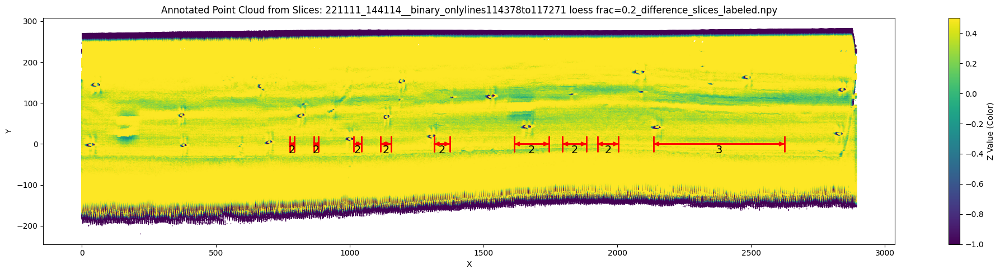

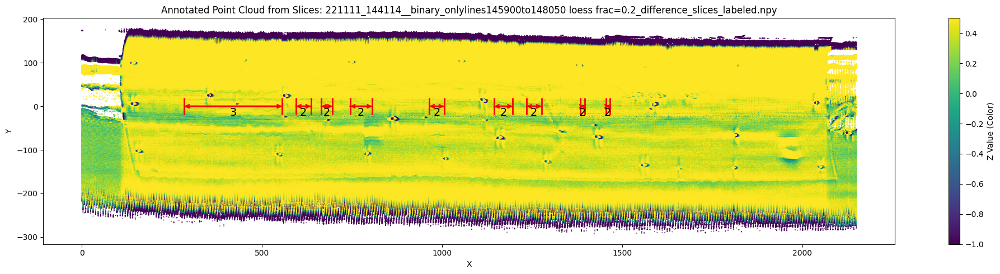

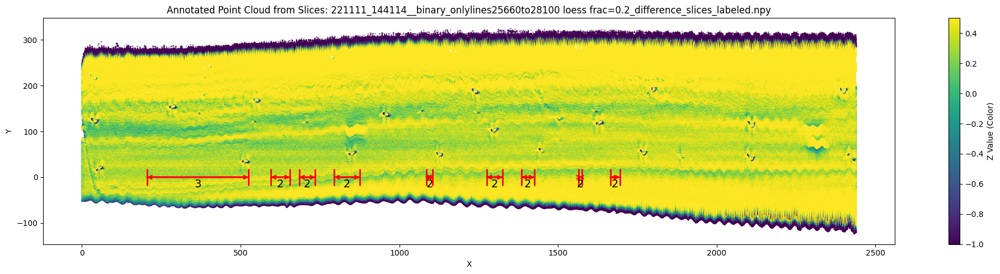

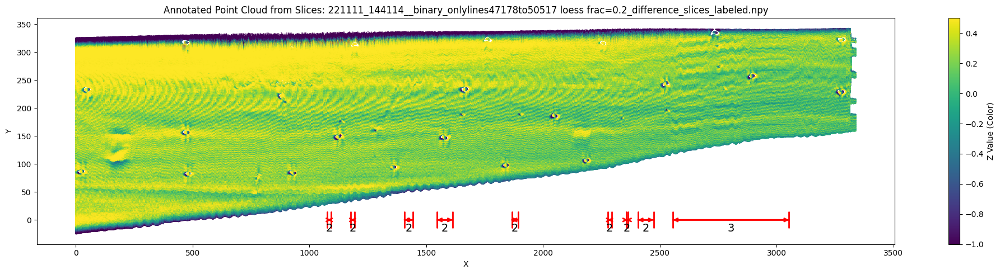

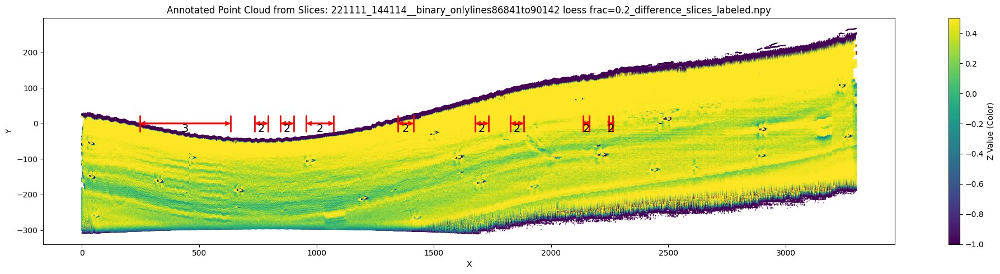

In [7]:
# Load and render the newly created pointclouds with annotations
labeled_files = [f for f in os.listdir(labeled_dir) if f.endswith("_slices_labeled.npy")]

for labeled_file in labeled_files:
    labeled_path = os.path.join(labeled_dir, labeled_file)
    data = np.load(labeled_path, allow_pickle=True).item()
    slices = data["slices"]  # shape: (num_slices, max_points, 3)
    labels = data["labels"]  # shape: (num_slices,)
    num_slices = slices.shape[0]

    # Flatten all points for scatter plot
    points = slices.reshape(-1, 3)
    mask = ~(np.all(points == 0, axis=1))
    points = points[mask]
    x, y, z = points[:, 0], points[:, 1], points[:, 2]

    fig, ax = plt.subplots(figsize=(20, 5))
    sc = ax.scatter(x, y, c=z, s=0.1, vmin=-1, vmax=0.5)
    plt.title(f"Annotated Point Cloud from Slices: {labeled_file}")
    plt.xlabel("X")
    plt.ylabel("Y")
    cbar = plt.colorbar(sc)
    cbar.set_label("Z Value (Color)")

    # Draw annotation lines for each label interval
    # Find annotation key
    base_name = labeled_file.replace("_slices_labeled.npy", "")
    annotation_key = None
    for key in annotations:
        if key in base_name:
            annotation_key = key
            break

    if annotation_key is not None:
        for (xmin, xmax), label in annotations[annotation_key].items():
            annotation_line(ax, xmin, xmax, y=0, text=label, ytext=-15, linecolor='red', linewidth=2, fontsize=14)

    plt.tight_layout()
    plt.show()